In [1]:
from diffusers import DiffusionPipeline
import torch

model_id = 'stabilityai/stable-diffusion-xl-base-1.0'

pipeline = DiffusionPipeline.from_pretrained(
  model_id,
  torch_dtype=torch.float16,
  variant="fp16",
  use_safetensors=True,
  requires_safety_checker=False,
)
pipeline.enable_sequential_cpu_offload()
pipeline.enable_xformers_memory_efficient_attention()
pipeline.safety_checker = None

Keyword arguments {'requires_safety_checker': False} are not expected by StableDiffusionXLPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

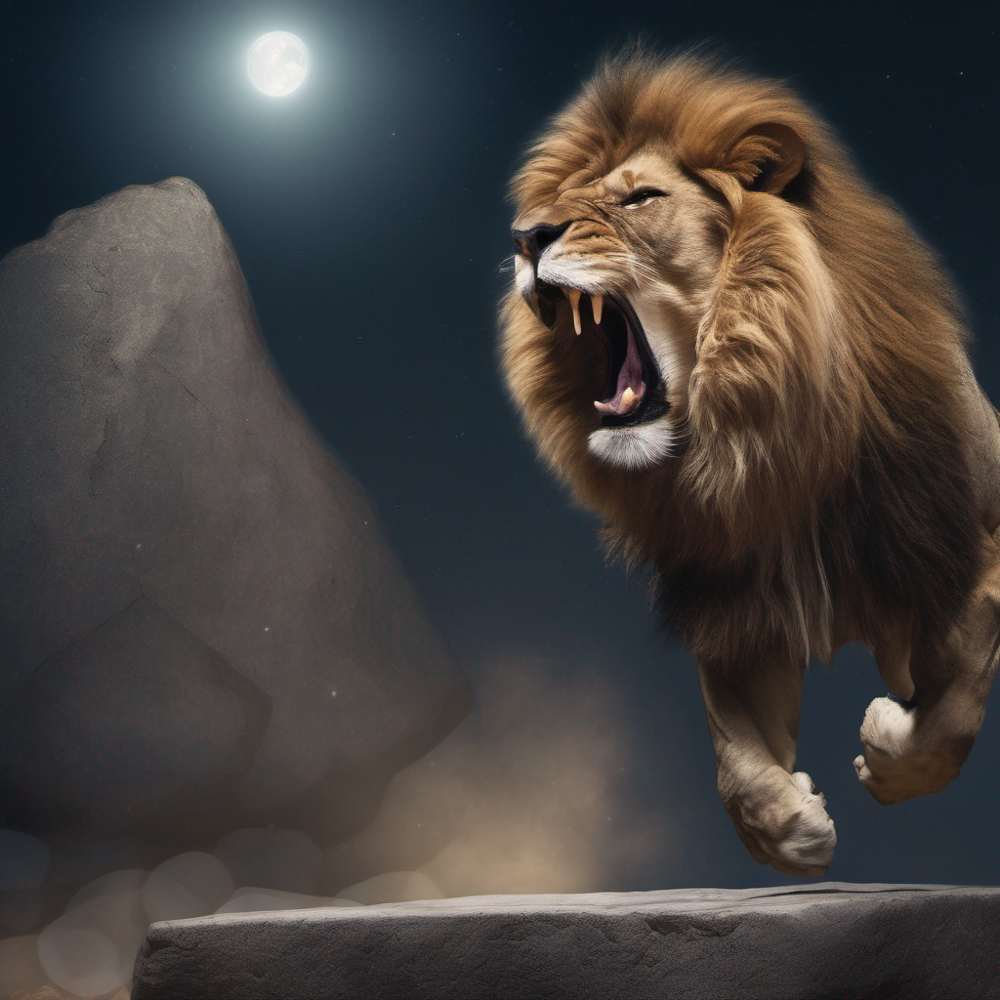

In [2]:
prompt = 'A majestic lion jumping from a big stone at night'

pipeline(prompt=prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

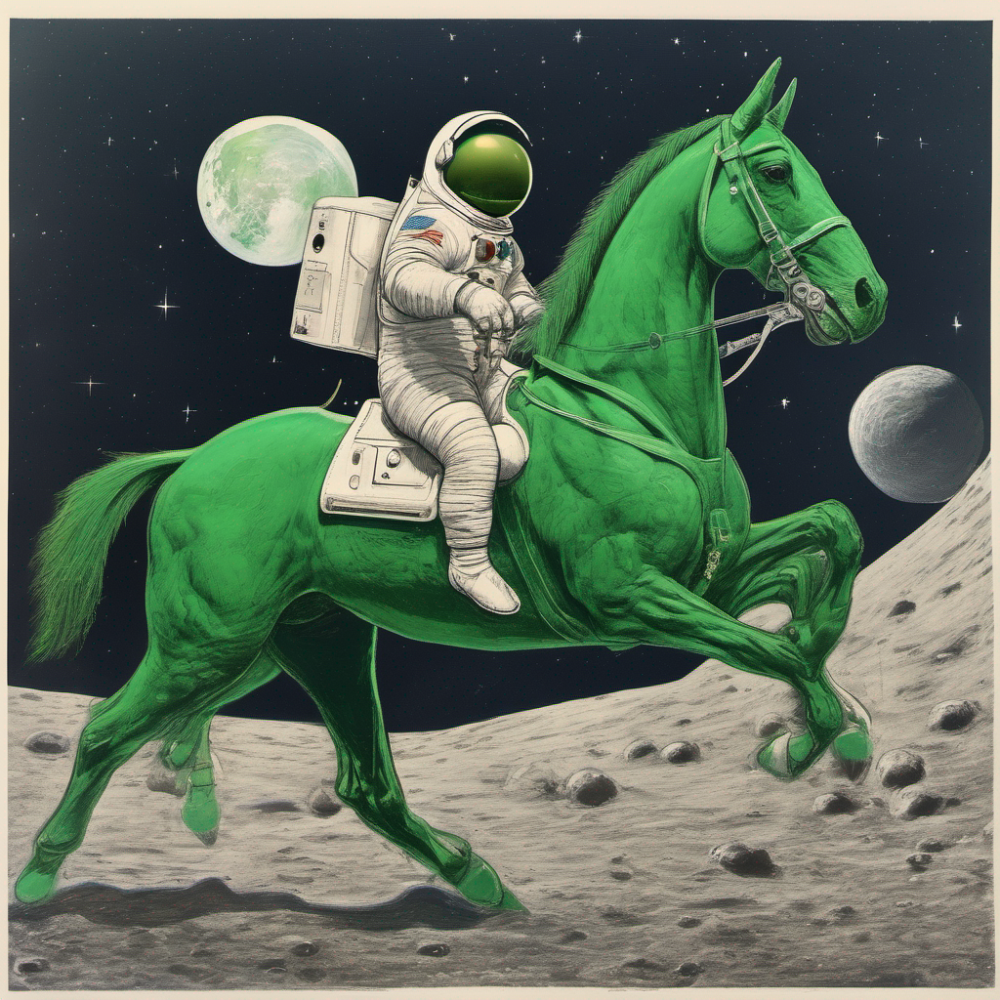

In [3]:
prompt = 'An astronaut riding a green horse on the moon'

pipeline(prompt=prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

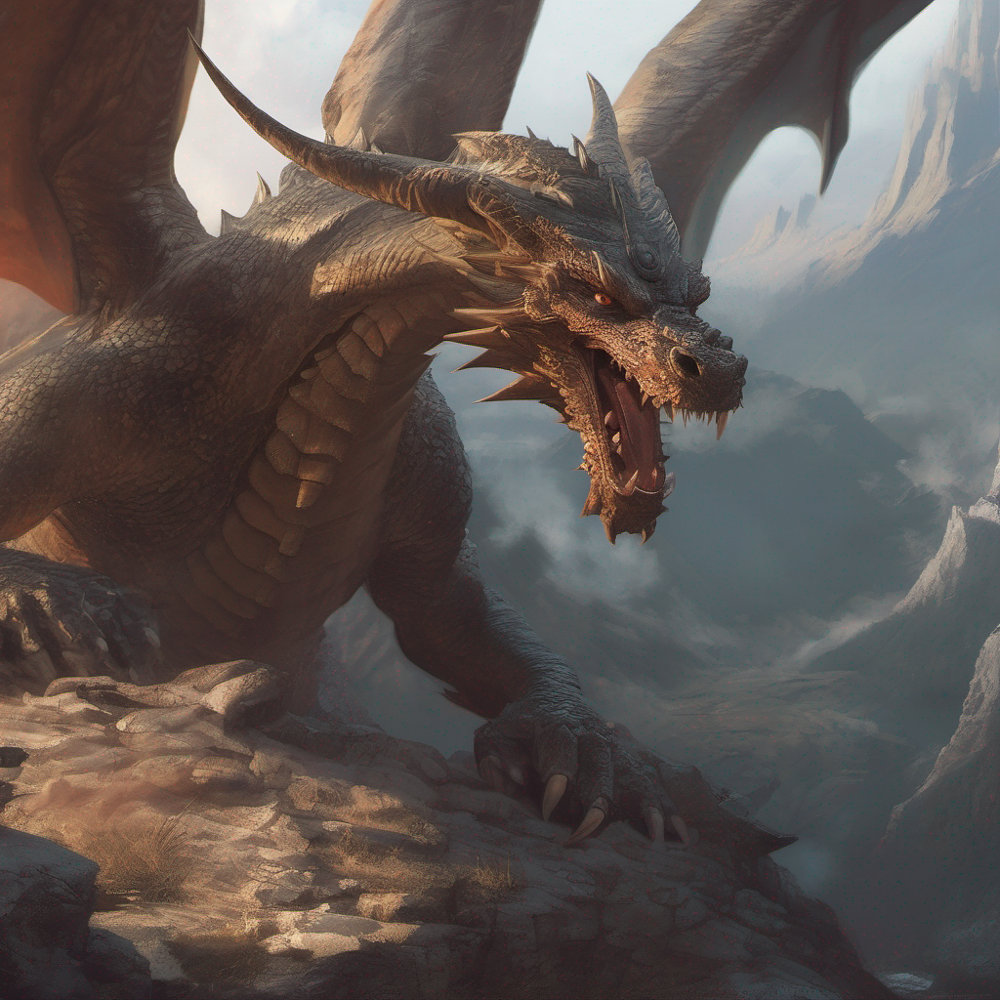

In [4]:
prompt = 'incredible detailed shot of a magnificent dragon waking up from a thousand years of sleep| the gaze of half-open eyes driving you insane| concept art| illustration'

pipeline(prompt=prompt).images[0]

In [5]:
from diffusers import StableDiffusionXLImg2ImgPipeline

refiner_id = 'stabilityai/stable-diffusion-xl-refiner-1.0'

refiner = StableDiffusionXLImg2ImgPipeline.from_pretrained(
  refiner_id,
  torch_dtype=torch.float16,
  variant='fp16',
  use_safetensors=True,
  requires_safety_checker=False,
)

refiner.enable_sequential_cpu_offload()
refiner.enable_xformers_memory_efficient_attention()
refiner.safety_checker = None

Keyword arguments {'requires_safety_checker': False} are not expected by StableDiffusionXLImg2ImgPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

In [6]:
prompt = 'incredible detailed shot of a magnificent dragon waking up from a thousand years of sleep| the gaze of half-open eyes driving you insane| concept art| illustration'

n_steps = 40
high_noise_frac = 0.8

latents = pipeline(
  prompt=prompt,
  num_inference_steps=n_steps,
  denoising_end=high_noise_frac,
  output_type='latent',
).images

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

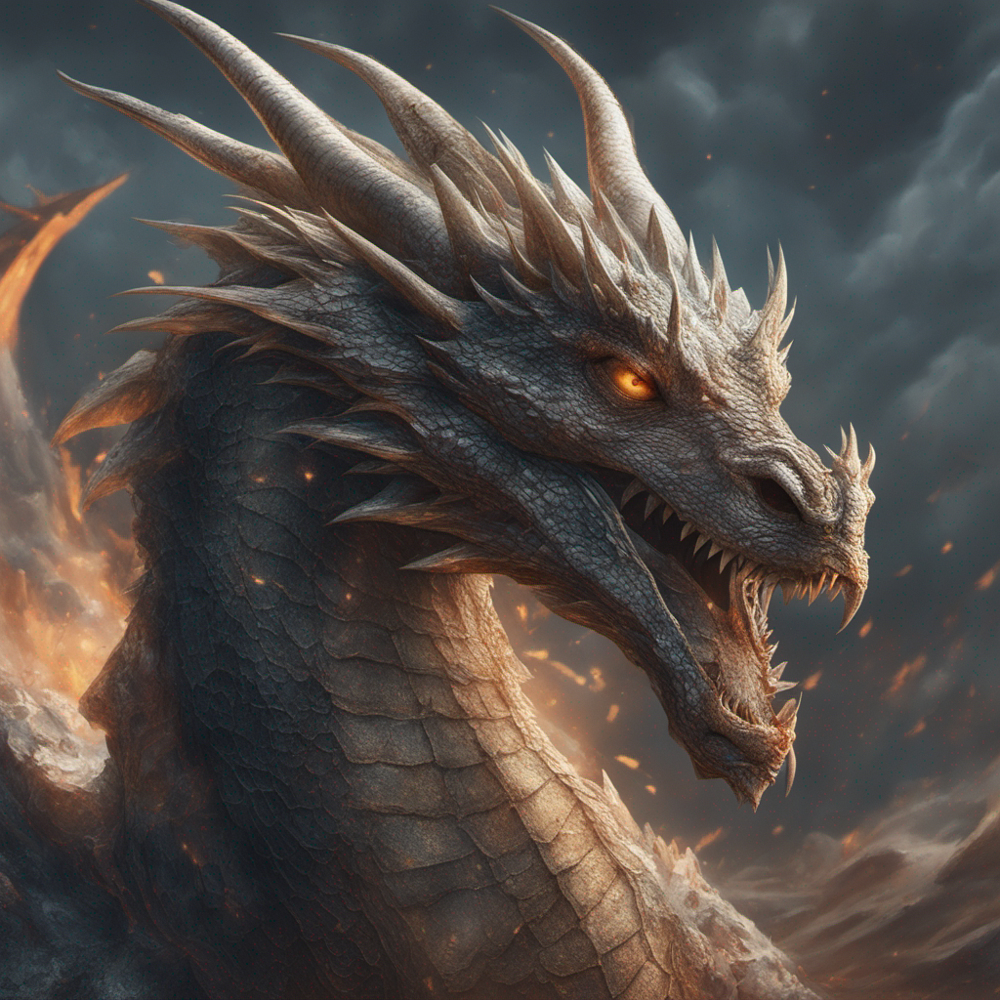

In [7]:
image = refiner(
  prompt=prompt,
  num_inference_steps=n_steps,
  denoising_start=high_noise_frac,
  image=latents,
).images[0]

image